In [1]:
%load_ext autoreload
%autoreload 2
import numpy as np
import random 
import tensorflow as tf
from matplotlib import pylab as plt
import matplotlib as mpl

In [2]:
def seed(num=123):
    random.seed(num + 123)
    np.random.seed(num + 456)
    tf.random.set_seed(num + 789)

## Linear model : weight direction and bias

In [3]:
from weight import simulation, learn, utils, config
Config = config.Config
x_span = config.Config.x_span
y_span = config.Config.y_span

# checkpoint at each milestone epoch
milestones = [1, 50, 100, 150, 200, 300, 400] 

&lt;matplotlib.collections.PathCollection at 0x7f6e350d2040&gt;

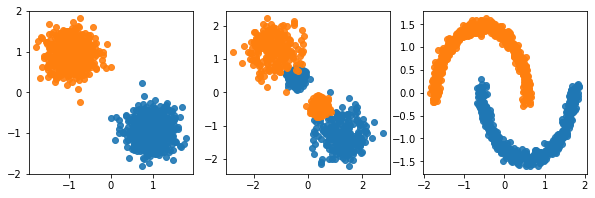

In [4]:
class Experiment:
    def __init__(self, X, y, verbose=0, lr=0.1, l2=0, batch_size=None):
        self.X = X
        self.y = y
        self.lr = lr #1 / np.linalg.svd(X)[1][0]
        self.l2 = l2
        self.verbose = verbose
        self.batch_size = batch_size
    
    def class_exp(self, pos, neg, milestone, use_deep=True):
        sample_weight = learn.make_class_weight(self.y, pos, neg)
        assert(len(sample_weight) == len(self.X))
        return self.sample_exp(sample_weight, milestone, use_deep)
        
    def sample_exp(self, sample_weight, milestone, use_deep=True):
        curve = learn.run_linear(self.X, self.y, sample_weight, 
                                l2=self.l2,
                                lr=self.lr, 
                                milestones=milestone, 
                                verbose=self.verbose,
                                batch_size=self.batch_size)
        if use_deep:
            model, weights = learn.run_non_linear(self.X, self.y, sample_weight, 
                                                    l2=self.l2, 
                                                    lr=self.lr,  
                                                    milestones=milestone, 
                                                    verbose=self.verbose,
                                                    batch_size=self.batch_size)
        else:
            model, weights = None, None
        return curve, (model, weights)

In [5]:
# generate linear seperable data
X, y = simulation.lin_sep()
margin = learn.get_margin(X, y)
lin_exp = Experiment(X, y)
lin_exp_result = {}

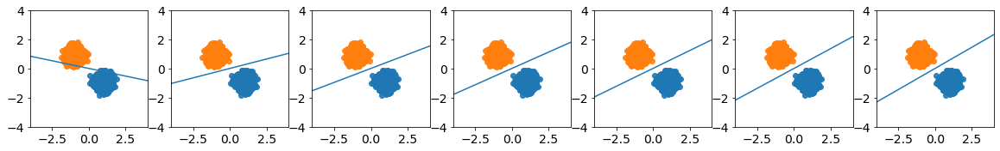

In [638]:
curve, (model, model_weight) = lin_exp.class_exp(1, 1, milestones)
lin_exp_result[(1, 1)] = curve, (model, model_weight)
#deep_results = utils.preprocess_deep(X, y, x_span, y_span, model, model_weight)
utils.progress_plot(X, y, x_span, y_span,
                    lin_results=curve, deep_results=None)

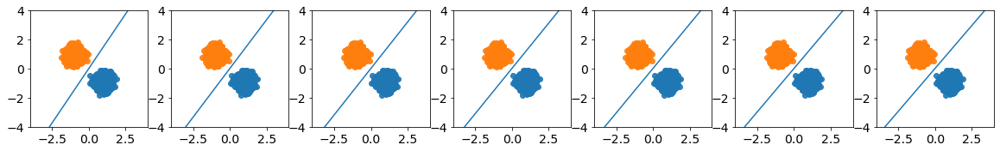

In [639]:
curve, (model, model_weight) = lin_exp.class_exp(1, 10, milestones, use_deep=False)
lin_exp_result[(1, 10)] = curve, (model, model_weight)
#deep_results = utils.preprocess_deep(X, y, x_span, y_span, model, model_weight)
utils.progress_plot(X, y, x_span, y_span,
                    lin_results=curve, deep_results=None)

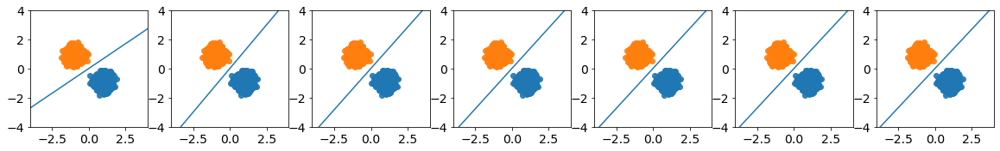

In [640]:
curve, (model, model_weight) = lin_exp.class_exp(10, 1, milestones, use_deep=False)
lin_exp_result[(10, 1)] = curve, (model, model_weight)
# deep_results = utils.preprocess_deep(X, y, x_span, y_span, model, model_weight)
utils.progress_plot(X, y, x_span, y_span,
                    lin_results=curve, deep_results=None)


In [34]:
seed(111)
X, y = simulation.non_lin_sep()
lin_exp = Experiment(X, y, lr=0.01, batch_size=8)
lin_double_result = {}
milestones = [1, 10, 25, 50, 100] 

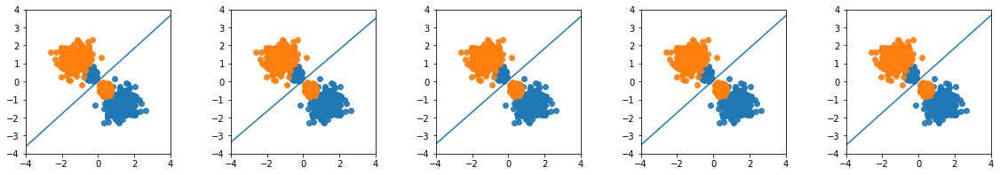

In [35]:
shift_1_curve, (model, model_weight) = lin_exp.class_exp(1, 1, milestones, use_deep=False)
# deep_results = utils.preprocess_deep(X, y, x_span, y_span, model, model_weight)
# lin_double_result[(1, 1)] = curve, (model, model_weight)
utils.progress_plot(X, y, x_span, y_span,
                    lin_results=shift_1_curve, deep_results=None)

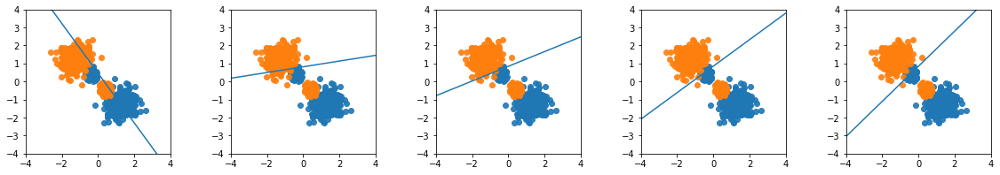

In [36]:
shift_2_curve, (model, model_weight) = lin_exp.class_exp(9, 1, milestones, use_deep=False)
#lin_double_result[(3, 1)] = curve, (model, model_weight)
# deep_results = utils.preprocess_deep(X, y, x_span, y_span, model, model_weight)
utils.progress_plot(X, y, x_span, y_span,
                    lin_results=shift_2_curve, deep_results=None)

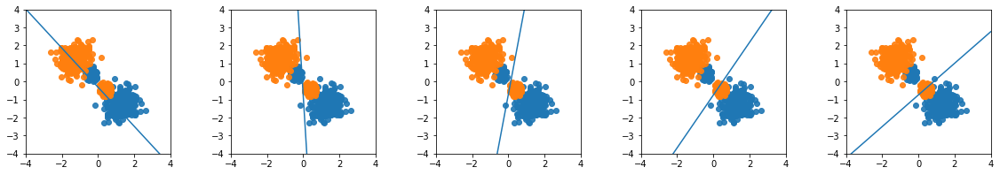

In [37]:
shift_3_curve, (model, model_weight) = lin_exp.class_exp(1, 9, milestones, use_deep=False)
#lin_double_result[(1, 3)] = curve, (model, model_weight)
# deep_results = utils.preprocess_deep(X, y, x_span, y_span, model, model_weight)
utils.progress_plot(X, y, x_span, y_span,
                    lin_results=shift_3_curve, deep_results=None)

In [38]:
shift_curve = [[x, y, z] for x, y, z in zip(shift_1_curve, shift_2_curve, shift_3_curve)]

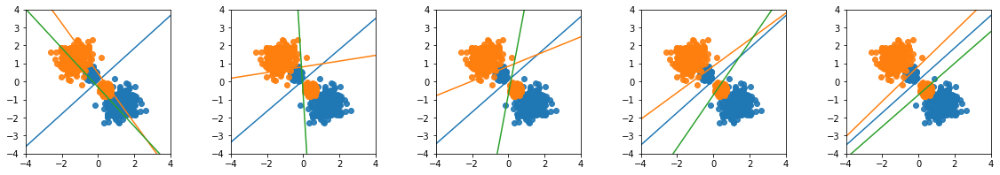

In [41]:
utils.progress_plot(X, y, x_span, y_span,
                    lin_results=shift_curve, deep_results=None)
plt.savefig('images/line_shift.jpg', dpi=300)

In [ ]:
seed(333)
X, y = simulation.non_lin_moon()
lin_exp = Experiment(X, y, lr=0.1, batch_size=32)
moon_results = {}

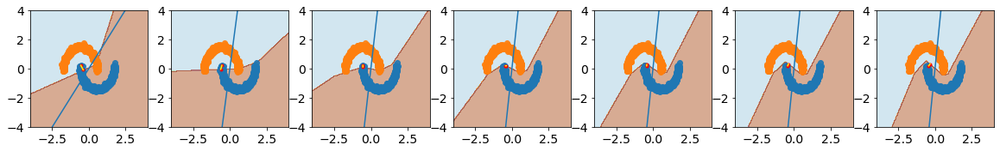

In [646]:
curve, (model, model_weight) = lin_exp.class_exp(1, 1, milestones)
moon_results[(1, 1)] = curve, (model, model_weight)
deep_results = utils.preprocess_deep(X, y, x_span, y_span, model, model_weight)
utils.progress_plot(X, y, x_span, y_span,
                    lin_results=curve, deep_results=deep_results)

In [647]:
((model.predict(X) > 0)[:, 0] == y).mean()

1.0

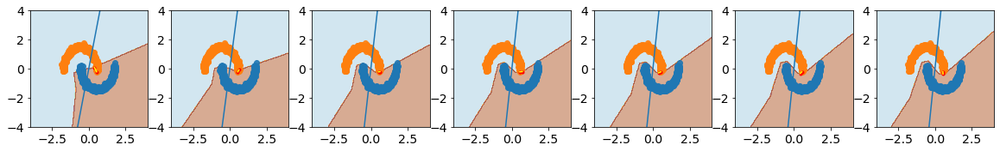

In [648]:
curve, (model, model_weight) = lin_exp.class_exp(3, 1, milestones)
moon_results[(3, 1)] = curve, (model, model_weight)
deep_results = utils.preprocess_deep(X, y, x_span, y_span, model, model_weight)
utils.progress_plot(X, y, x_span, y_span,
                    lin_results=curve, deep_results=deep_results)

In [649]:
((model.predict(X) > 0)[:, 0] == y).mean()

1.0

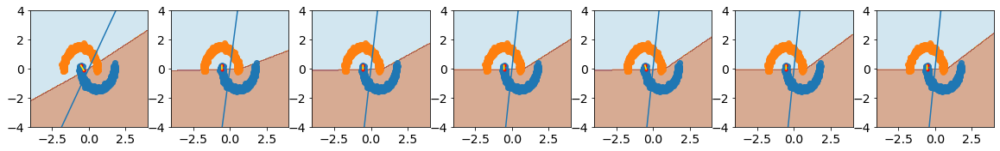

In [650]:
curve, (model, model_weight) = lin_exp.class_exp(1, 3, milestones)
moon_results[(1, 3)] = curve, (model, model_weight)
deep_results = utils.preprocess_deep(X, y, x_span, y_span, model, model_weight)
utils.progress_plot(X, y, x_span, y_span,
                    lin_results=curve, deep_results=deep_results)

In [651]:
((model.predict(X) > 0)[:, 0] == y).mean()

0.951171875

# Linear model : Convergence speed
We measure the convergence speed by comparing the margins and directions between trained model and the optimal solutions gained from SVM with hard-margin since the data is linear separable.

In [98]:
# common milestones with increasing gap between epochs
def get_milestones(limit=400, gap_size=0.5):
    milestones = []
    step, gap = 1, 1
    while step < limit:
        milestones.append(step)
        gap += gap_size
        step += int(gap)
    return milestones
milestones = get_milestones(1000, 5)

## Linear separable data

In [99]:
# generate linear seperable data
seed(333)
sigmoid = lambda x: np.exp(x) / (1 + np.exp(x))
X, y = simulation.lin_sep()
xx, yy = np.meshgrid(x_span, y_span)
margin = learn.get_margin(X, y)
lin_exp = Experiment(X, y, lr=0.1, verbose=0, batch_size=32)



from sklearn import svm
clf = svm.SVC(kernel='linear', C=1000)
clf.fit(X, y)
func_margins = 2 * (y - 0.5) * clf.decision_function(X)

sample_weight = sigmoid(func_margins)
optimal_dir = clf.coef_ / np.linalg.norm(clf.coef_)
assert(sum(func_margins < 0) == 0)
class_weights = [(1, 1), (1, 2), (2, 1)]

### With class specific weight

In [100]:
curve_cache = {}
for weight in class_weights:
    curve, (_, _) = lin_exp.class_exp(weight[0], weight[1], milestones, use_deep=False)
    curve_cache[weight] = curve

In [101]:
lin_margin_exp = {}
for weight in class_weights:
    margins = utils.get_linear_margin(X, y, xx, yy, curve_cache[weight])
    lin_margin_exp[weight] = margins

### with weight generated by SVM

In [102]:
from sklearn import svm
clf = svm.SVC(kernel='linear', C=1000)
clf.fit(X, y)
func_margins = 2 * (y - 0.5) * clf.decision_function(X)

sample_weight = np.exp(1/func_margins)
optimal_dir = clf.coef_ / np.linalg.norm(clf.coef_)
assert(sum(func_margins < 0) == 0)

* margin comparison

In [103]:
opt_svm_curves, (opt_svm_mlp, opt_svm_mlp_weights) = lin_exp.sample_exp(sample_weight, milestones, use_deep=True)

In [104]:
opt_svm_margins = utils.get_linear_margin(X, y, xx, yy, opt_svm_curves)
result = utils.preprocess_deep(X, y, x_span, y_span, opt_svm_mlp, opt_svm_mlp_weights)
opt_svm_mlp_margins = [x[1] for x in result]

* Angle comparison

In [105]:
lin_angle_exp = {}
for weight in class_weights:
     coefs_arr = np.array([x[0] for x in curve_cache[weight]])
     coefs_arr = np.squeeze(coefs_arr)
     coefs_arr = coefs_arr / np.linalg.norm(coefs_arr, axis=1)[:, np.newaxis]
     lin_angle_exp[weight] = coefs_arr.dot(optimal_dir.T)

opt_svm_arr = np.array([x[0] for x in opt_svm_curves])
opt_svm_arr = np.squeeze(opt_svm_arr)
opt_svm_arr = opt_svm_arr / np.linalg.norm(opt_svm_arr, axis=1)[:, np.newaxis]
opt_svp_angle = opt_svm_arr.dot(optimal_dir.T)

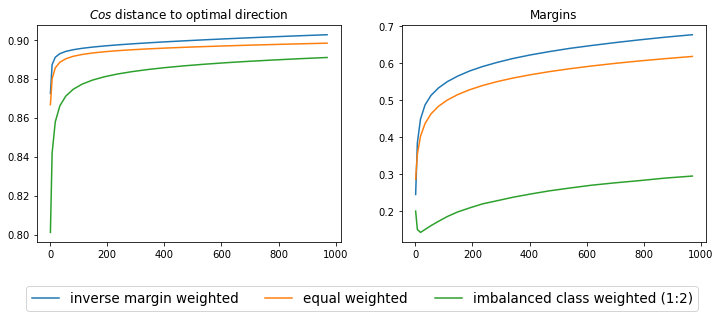

In [115]:
fig, axes = plt.subplots(ncols=2, figsize=(12, 4), sharex=True)
ax = axes[0]
ax.plot(milestones,  opt_svp_angle, label='inverse margin weighted')
ax.plot(milestones,  lin_angle_exp[(1, 1)], label='equal weighted')
ax.plot(milestones,  lin_angle_exp[(1, 2)], label='imbalanced class weighted (1:2)')
ax.set_title('$Cos$ distance to optimal direction')
#ax.legend(prop={'size': 12.5})
#ax.legend()

ax = axes[1]
ax.plot(milestones, opt_svm_margins, label='inverse margin weighted')
ax.plot(milestones, lin_margin_exp[(1, 1)], label='equal weighted')
ax.plot(milestones, lin_margin_exp[(1, 2)], label='imbalanced class weighted (1:2)')
ax.set_title('Margins')
ax.legend(loc='upper center', fontsize='small', ncol=3, bbox_to_anchor=(-0.13, -0.17), prop={'size': 13.5})
plt.savefig('images/lin_progress.jpg', bbox_inches='tight', dpi=300)

## Non linear separable data

In [155]:
milestones = get_milestones(400, 5)

In [156]:
# generate linear seperable data
seed(333)
X, y = simulation.non_lin_moon()
xx, yy = np.meshgrid(x_span, y_span)
#margin = learn.get_margin(X, y)
nonlin_exp = Experiment(X, y, lr=0.1, verbose=0, batch_size=32)

### With class specific weight

In [157]:
class_weights = [(0.5, 0.5), (1, 2)]
model_cache = {}
for weight in class_weights:
    curve, (model, weights) = nonlin_exp.class_exp(weight[0], weight[1], milestones, use_deep=True)
    model_cache[weight] = (model, weights)

In [158]:
lin_margin_exp = {}
for weight in class_weights:
    model, model_weights = model_cache[weight]
    result = utils.preprocess_deep(X, y, x_span, y_span, model, model_weights)
    lin_margin_exp[weight] = [x[1] for x in result]

&lt;matplotlib.legend.Legend at 0x7f6e54562760&gt;

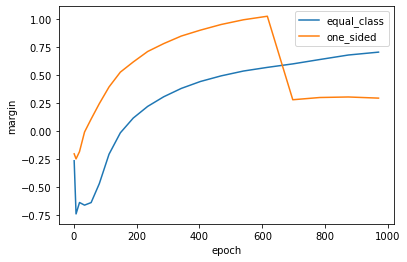

In [159]:
plt.plot(milestones, lin_margin_exp[(0.5, 0.5)], label='equal_class')
plt.plot(milestones, lin_margin_exp[(1, 2)], label='one_sided')
plt.ylabel('margin')
plt.xlabel('epoch')
plt.legend()

Text(0.5, 0, &#39;epoch&#39;)

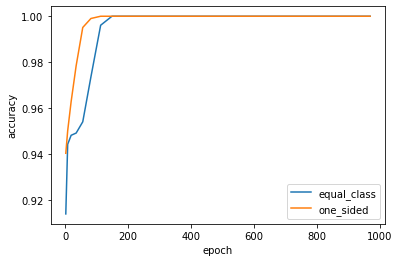

In [160]:
def get_acc(model, weights, x, y):
    acc = []
    for weight in weights:
        model.set_weights(weight)
        acc.append(((model.predict(x) > 0)[:, 0] == y).mean())
    return acc

key = (0.5, 0.5)
acc = get_acc( model_cache[key][0],  model_cache[key][1], X, y)
plt.plot(milestones, acc, label='equal_class')

key = (1, 2)
acc = get_acc( model_cache[key][0],  model_cache[key][1], X, y)
plt.plot(milestones, acc, label='one_sided')
plt.legend()
plt.ylabel('accuracy')
plt.xlabel('epoch')

### Generalization experiments on moon data

In [523]:
# generate linear seperable data
seed(123)
X, y = simulation.non_lin_moon(size=2048)
xx, yy = np.meshgrid(x_span, y_span)
#margin = learn.get_margin(X, y)
#nonlin_exp = Experiment(X, y, lr=0.1, verbose=0)

def shuffle_sample(x, y, ratio):
    index = np.arange(len(x))
    np.random.shuffle(index)
    x = x[index]
    y = y[index]

    train_size = int(len(x) * ratio)
    train_x = x[:train_size]
    train_y = y[:train_size]
    test_x = x[train_size:]
    test_y = y[train_size:]
    return (train_x, train_y), (test_x, test_y)

(pos_tr_x, pos_tr_y), (pos_te_x, pos_te_y) = shuffle_sample(X[y > 0], y[y > 0], 0.2)
(neg_tr_x, neg_tr_y), (neg_te_x, neg_te_y) = shuffle_sample(X[y == 0], y[y == 0], 0.8)

tr_x = np.concatenate([pos_tr_x, neg_tr_x], axis=0)
tr_y = np.concatenate([pos_tr_y, neg_tr_y], axis=0)
te_x = np.concatenate([pos_te_x, neg_te_x], axis=0)
te_y = np.concatenate([pos_te_y, neg_te_y], axis=0)

milestones = get_milestones(200, 2)
nonlin_exp = Experiment(X, y, lr=0.001, verbose=0, batch_size=64)

In [524]:
_, (model, model_weights) = nonlin_exp.class_exp(1, 1, milestones, use_deep=True)
_, (w_model, w_model_weights) = nonlin_exp.class_exp(1, 4, milestones, use_deep=True)
_, (w2_model, w2_model_weights) = nonlin_exp.class_exp(1/4, 4, milestones, use_deep=True)

In [525]:
def get_loss(model, weights, x, y):
    loss = []
    for weight in weights:
        model.set_weights(weight)
        y_pred = model.predict(x)
        y_label = 2 * y - 1
        loss.append(np.exp(-y_label * y_pred).mean())
        #acc.append(((model.predict(x) > 0)[:, 0] == y).mean())
    return loss


In [526]:
acc = get_loss(model, model_weights, te_x, te_y)
w_acc = get_loss(w_model, w_model_weights, te_x, te_y)
w2_acc = get_loss(w2_model, w2_model_weights, te_x, te_y)

In [527]:
len(acc)

14

In [528]:
len(milestones)

14

In [564]:
plt.rcParams.update({'font.size': 14})

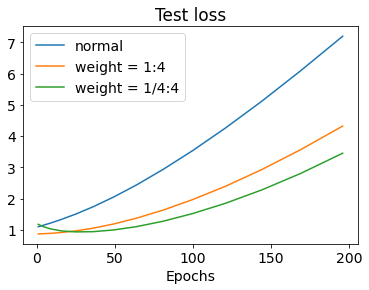

In [578]:
plt.plot(milestones, acc, label='normal')
plt.plot(milestones, w_acc, label='weight = 1:4')
plt.plot(milestones, w2_acc, label='weight = 1/4:4')
#plt.xlim(200, 500)
#plt.ylim(0.85)
plt.xlabel('Epochs')
plt.title('Test loss')
plt.legend()
plt.savefig('./images/general_acc.jpg', dpi=300, bbox_inches='tight')

In [672]:
seed(333)
X_1, y_1 = simulation.lin_sep()
exp_1 = Experiment(X_1, y_1)
curve_1, (model_1, model_weight_1) = exp_1.class_exp(1, 1, milestone=[100])
results_1 = utils.preprocess_deep(X_1, y_1, x_span, y_span, model_1, model_weight_1)
seed(333)
X_2, y_2 = simulation.non_lin_sep()
exp_2 = Experiment(X_2, y_2, batch_size=32)
curve_2, (model_2, model_weight_2) = exp_2.class_exp(1, 1, milestone=[200])
results_2 = utils.preprocess_deep(X_2, y_2, x_span, y_span, model_2, model_weight_2)
seed(333)
X_3, y_3 = simulation.non_lin_moon()
exp_3 = Experiment(X_3, y_3, lr=0.1, batch_size=32)
curve_3, (model_3, model_weight_2) = exp_3.class_exp(1, 1, milestone=[400])
results_3 = utils.preprocess_deep(X_2, y_2, x_span, y_span, model_2, model_weight_2)

seed(333)
X_4, y_4 = simulation.non_lin_moon(size=1024)
(pos_tr_x, pos_tr_y), (pos_te_x, pos_te_y) = shuffle_sample(X_4[y_4 > 0], y_4[y_4 > 0], 0.9)
(neg_tr_x, neg_tr_y), (neg_te_x, neg_te_y) = shuffle_sample(X_4[y_4 == 0], y_4[y_4 == 0], 0.1)
X_4 = np.concatenate([pos_tr_x, neg_tr_x], axis=0)
y_4 = np.concatenate([pos_tr_y, neg_tr_y], axis=0)
exp_4 = Experiment(X_4, y_4, lr=0.1, batch_size=32)
curve_4, (model_4, model_weight_4) = exp_4.class_exp(1, 1, milestone=[400])
results_4 = utils.preprocess_deep(X_4, y_4, x_span, y_span, model_4, model_weight_4)

In [673]:
((model_3.predict(X_3)[:, 0] > 0) == y_3).mean()

1.0

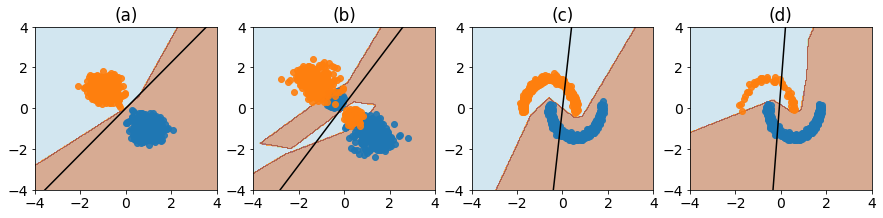

In [675]:
# plot the landscape that will be used
figure, axes = plt.subplots(ncols = 4, figsize=(15, 3))
#X_1, y_1 = simulation.lin_sep()

ax = axes[0]
utils.fitted_plot(ax, x_span, y_span, results_1[0][0], X_1, y_1, curve_1[0])
ax.set_title('(a)')

ax = axes[1]
utils.fitted_plot(ax, x_span, y_span, results_2[0][0], X_2, y_2, curve_2[0])
ax.set_title('(b)')

ax = axes[2]
utils.fitted_plot(ax, x_span, y_span, results_3[0][0], X_3, y_3, curve_3[0])
ax.set_title('(c)')

(pos_tr_x, pos_tr_y), (pos_te_x, pos_te_y) = shuffle_sample(X[y > 0], y[y > 0], 0.9)
(neg_tr_x, neg_tr_y), (neg_te_x, neg_te_y) = shuffle_sample(X[y == 0], y[y == 0], 0.1)

tr_x = np.concatenate([pos_tr_x, neg_tr_x], axis=0)
tr_y = np.concatenate([pos_tr_y, neg_tr_y], axis=0)
# te_x = np.concatenate([pos_te_x, neg_te_x], axis=0)
# te_y = np.concatenate([pos_te_y, neg_te_y], axis=0)

pos_cord, neg_cord = utils.split_cord(tr_x, tr_y)
ax = axes[3]
ax.set_title('(d)')
utils.fitted_plot(ax, x_span, y_span, results_4[0][0], X_4, y_4, curve_4[0])
# ax.set_title('imbalanced moon')
plt.savefig('./images/examples.jpg', bbox_inches='tight')